# Starter Problems

## Strang Matrix Problem

In [1]:
N = 10
A = zeros(N,N)
for i in 1:N, j in 1:N
    abs(i-j)<=1 && (A[i,j]+=1)
    i==j && (A[i,j]-=3)
end
A

10×10 Array{Float64,2}:
 -2.0   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0
  1.0  -2.0   1.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   1.0  -2.0   1.0   0.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   1.0  -2.0   1.0   0.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   1.0  -2.0   1.0   0.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   1.0  -2.0   1.0   0.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   1.0  -2.0   1.0   0.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0   1.0  -2.0   1.0   0.0
  0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0  -2.0   1.0
  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0  -2.0

## Factorial Problem

In [2]:
function my_factorial(n)
    k = one(n)
    for i in 1:n
        k *= i
    end
    k
end

my_factorial(4)
my_factorial(30)
my_factorial(big(30))

265252859812191058636308480000000

## Binomial Problem

In [3]:
function binomial_rv(n, p)
    count = zero(n)
    U = rand(n)
    for i in 1:n
      U[i] < p && (count += 1)
    end
    count
end

bs = [binomial_rv(10, 0.5) for j in 1:10]

10-element Array{Int64,1}:
 5
 5
 1
 5
 5
 2
 4
 5
 7
 6

## Monte Carlo $\pi$ Problem

In [7]:
n = 10000000

count = 0
for i in 1:n
    global count
    u, v = 2rand(2) .- 1
    d = sqrt(u^2 + v^2)  # Distance from middle of square
    d < 1 && (count += 1)
end

area_estimate = count / n

print(area_estimate * 4)  # dividing by radius**2

3.1420112

# Integration Problems

## Timeseries Generation Problem

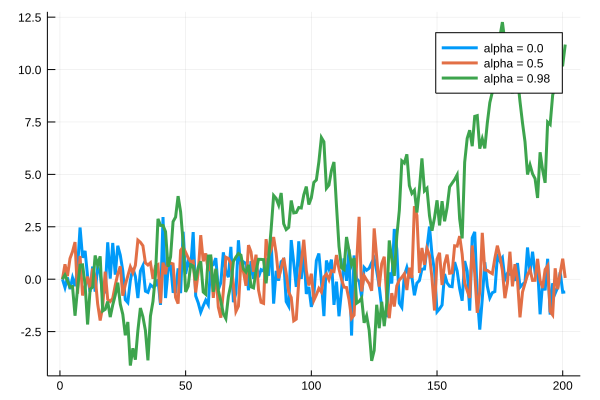

In [8]:
using Plots; gr()

alphas = [0.0, 0.5, 0.98]
T = 200

series = []
labels = []

for alpha in alphas
    x = zeros(T + 1)
    x[1] = 0.0
    for t in 1:T
        x[t+1] = alpha * x[t] + randn()
    end
    push!(series, x)
    push!(labels, "alpha = $alpha")
end

plot(series, label=reshape(labels,1,length(labels)),lw=3)

## Logistic Equation Problem

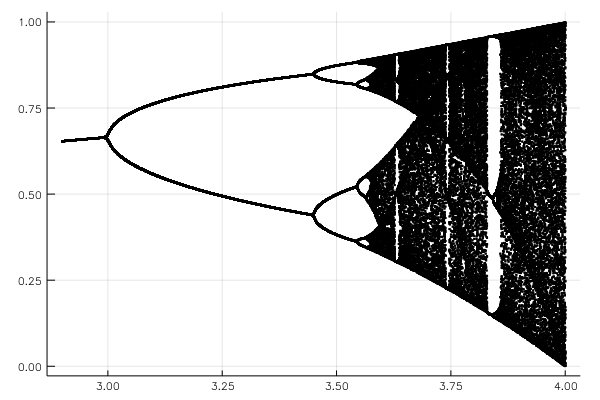

In [13]:
r = 2.9:.001:4; numAttract = 100
steady = ones(length(r),1)*.25
for i=1:400 ## Get to steady state
  @. steady = r*steady*(1-steady)
end
x = zeros(length(steady),numAttract)
x[:,1] = steady
@inbounds for i=2:numAttract ## Grab values at the attractor
  @. x[:,i] = r*x[:,i-1]*(1-x[:,i-1])
end
using Plots; gr(fmt=:png)
plot(collect(r),x,seriestype=:scatter,markersize=.002,legend=false,color=:black)